<a href="https://colab.research.google.com/github/IshanSFernando/moving-object-counting/blob/main/Tracking_Hexagonal_nuts_in_a_moving_belt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **180172C**

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from google.colab import files

%matplotlib inline

In [ ]:
uploaded=files.upload()

Saving template.png to template.png
Saving belt.png to belt.png
Saving conveyor_with_rotation.mp4 to conveyor_with_rotation.mp4
Saving conveyor_two_frame.mp4 to conveyor_two_frame.mp4


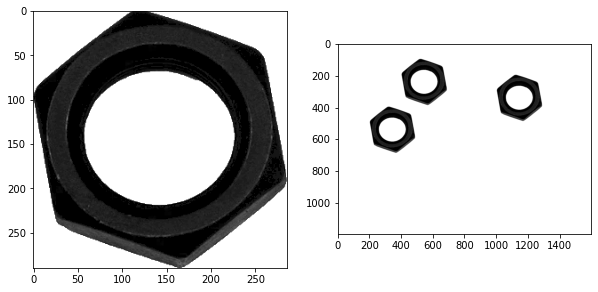

In [ ]:
template_im = cv.imread(r'template.png', cv.IMREAD_GRAYSCALE)
belt_im = cv.imread(r'belt.png', cv.IMREAD_GRAYSCALE)
fig, ax = plt. subplots(1,2,figsize=(10,10))
ax[0].imshow(template_im, cmap='gray')
ax[1].imshow(belt_im, cmap='gray')
plt.show()


# **PART 1**

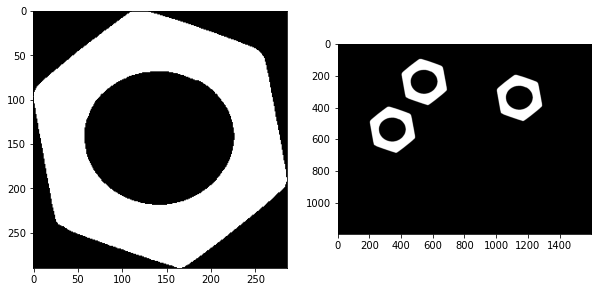

In [ ]:
th_t, img_t = cv.threshold(template_im,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)
th_b, img_b = cv.threshold(belt_im,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)
fig, ax = plt. subplots(1,2,figsize=(10,10))
ax[0].imshow(img_t, cmap='gray')
ax[1].imshow(img_b, cmap='gray')
plt.show()

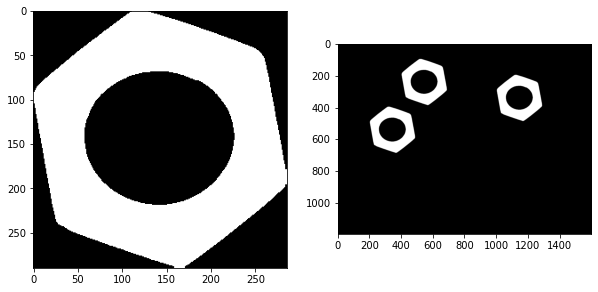

In [ ]:
kernel = np.ones((3,3),dtype="uint8")
closing_t = cv.morphologyEx(img_t, cv.MORPH_CLOSE, kernel)
closing_b = cv.morphologyEx(img_b, cv.MORPH_CLOSE, kernel)
fig, ax = plt. subplots(1,2,figsize=(10,10))
ax[0].imshow(closing_t, cmap='gray')
ax[1].imshow(closing_b, cmap='gray')
plt.show()

In [ ]:
retval_t, labels_t, stats_t, centroids_t = cv.connectedComponentsWithStats(closing_t)
retval_b, labels_b, stats_b, centroids_b = cv.connectedComponentsWithStats(closing_b)
print("Number of connected components in template ",retval_t-1)
print("Number of connected components in belt ",retval_b-1)

Number of connected components in template  1
Number of connected components in belt  3


**What are Statics?**

Statics is a matrix of the statistics. It has a length equal to the number of labels and a width equal to the number of statistics.

Statistics represent by each column


*   The leftmost (x) coordinate which is the inclusive start of the bounding box in the horizontal direction.
*   The topmost (y) coordinate which is the inclusive start of the bounding box in the vertical direction.
*   The horizontal size of the bounding box
*   The vertical size of the bounding box
*   The total area (in pixels) of the connected component 

---
**What are Centroids?**

Centroids is a matrix with the x and y locations of each centroid. The row in this matrix represents the label number.


In [ ]:
contours_t, hierarchy_t = cv.findContours(closing_t, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
contours_b, hierarchy_b = cv.findContours(closing_b, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

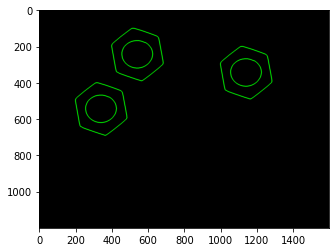

In [ ]:
# Visualizing contours
im_contours_belt = np.zeros((belt_im.shape[0],belt_im.shape[1],3), np.uint8)
conts = cv.drawContours(im_contours_belt, contours_b, -1, (0,255,0), 3).astype('uint8')
plt.imshow(conts)

In [ ]:
label = 1 # remember that the label of the background is 0
belt = ((labels_b >= label)*255).astype('uint8')
belt_cont, template_hierarchy = cv.findContours(belt, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
for j,c in enumerate(belt_cont):
    print(cv.matchShapes(contours_t[0], c, cv.CONTOURS_MATCH_I1, 0.0))

0.00010071698397151607
0.00010071698397928763
0.00010071698397484674


# **PART 2**

In [ ]:
ca = cv.contourArea( contours_b[1])
M = cv.moments(contours_b[1])
cx, cy = int(M['m10']/M['m00']) , int(M['m01']/M['m00'])
count = 1
object_prev_frame = np.array([cx, cy, ca, count])
delta_x = 15
print("the area of the contours_b[1]:-",ca)
print("cx:-",cx)
print("cy:-",cy)
print("object prev frame:-",object_prev_frame)

the area of the contours_b[1]:- 20080.0
cx:- 341
cy:- 542
object prev frame:- [3.410e+02 5.420e+02 2.008e+04 1.000e+00]


# **PART 3**

In [ ]:
def get_indexed_image(im):
    th_bin, img_bin = cv.threshold(im,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)
    kernel = np.ones((3,3),dtype="uint8")
    closing = cv.morphologyEx(img_bin, cv.MORPH_CLOSE, kernel)
    retval, labels, stats, centroids = cv.connectedComponentsWithStats(closing)
    return retval, labels, stats, centroids    

In [ ]:
def is_new(a, b, delta, i):
    for array in a:
        for index in i:
            if (abs(b[index] - array[index])<delta):
                return False
    return True

In [ ]:
a = np.array([[1.36100e+03, 5.53000e+02, 5.99245e+04, 2.00000e+00],
[7.61000e+02, 4.53000e+02, 5.99385e+04, 1.00000e+00],
[1.55200e+03, 2.43000e+02, 6.00585e+04, 3.00000e+00]])
b = np.array([7.51000e+02, 4.53000e+02, 5.99385e+04, 3.00000e+00])
delta = np.array([delta_x])
i = np.array([0])
assert is_new(a, b, delta, i) == False, " Check the function "

In [ ]:
 def prev_index(a, b, delta, i):
    index = -1
    for array in a:
        index+=1
        if not(is_new([array], b, delta, i)):
            return index
    return -1

In [ ]:
a = np.array([[1.36100e+03, 5.53000e+02, 5.99245e+04, 2.00000e+00],
[7.61000e+02, 4.53000e+02, 5.99385e+04, 1.00000e+00],
[1.55200e+03, 2.43000e+02, 6.00585e+04, 3.00000e+00]])
b = np.array([7.51000e+02, 4.53000e+02, 5.99385e+04, 3.00000e+00])
delta = np.array([delta_x])
i = np.array([0])
assert prev_index(a,b,delta,i) == 1, " Check the function "

# **Implement a code to detect hexagonal nuts in a moving convey belt**

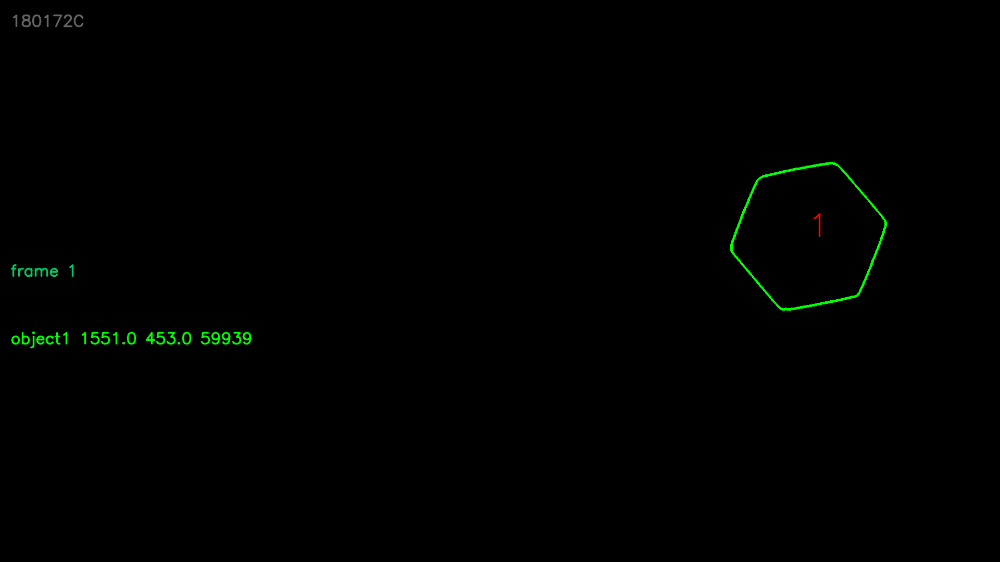

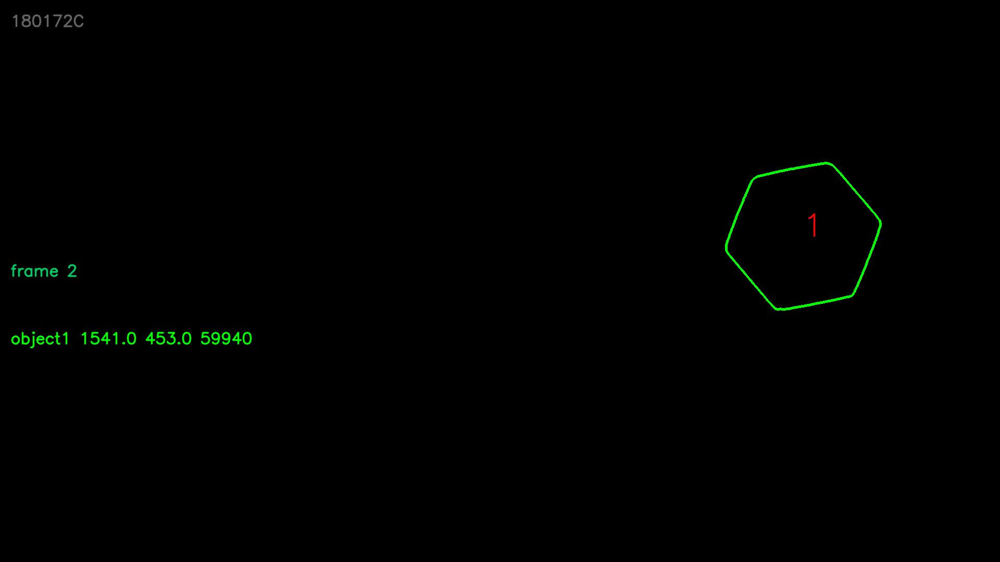

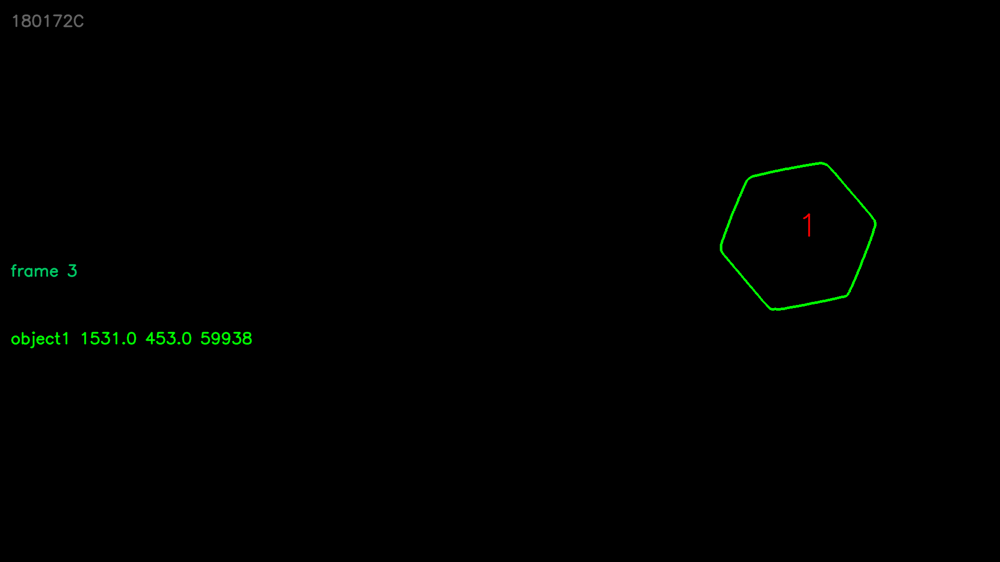

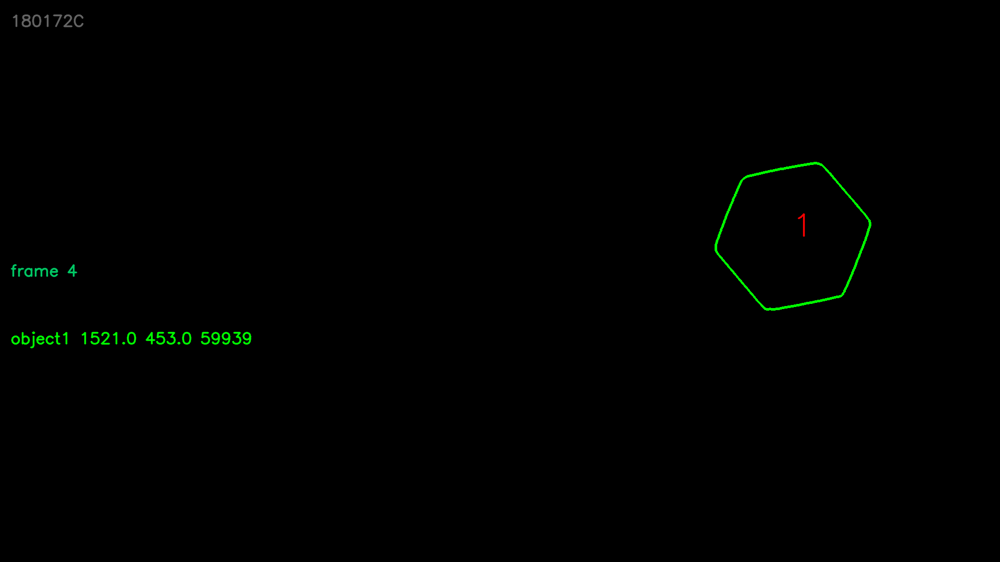

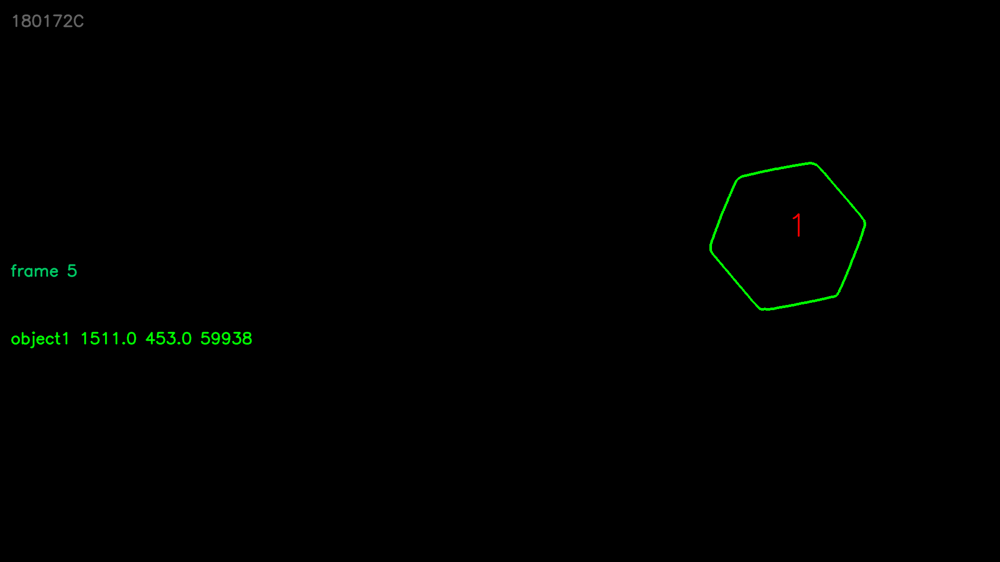

...

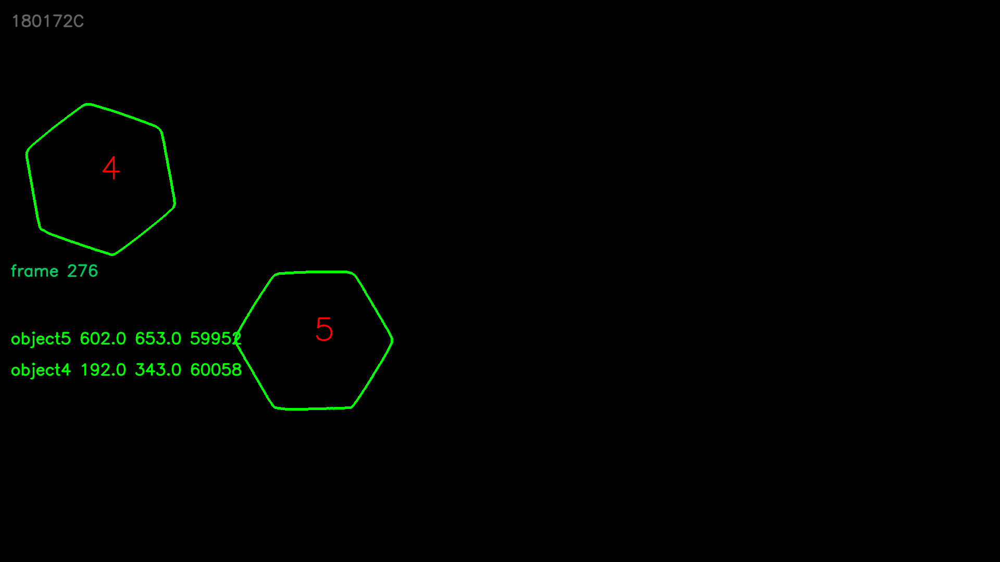

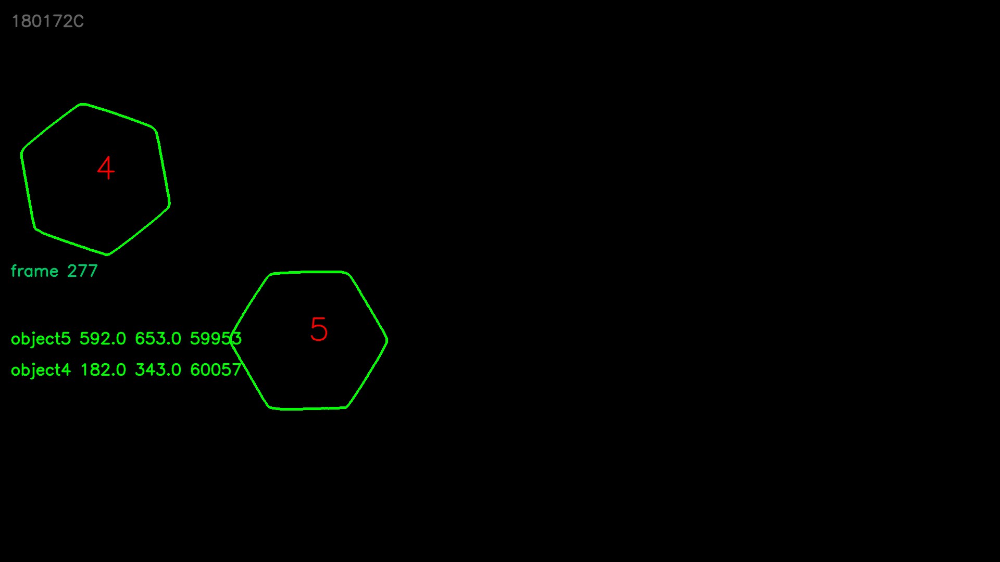

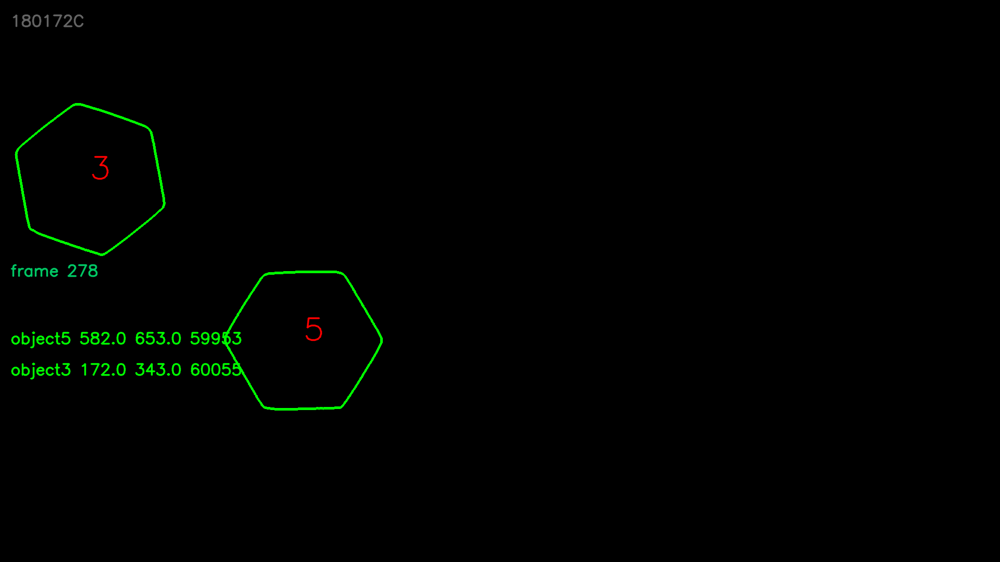

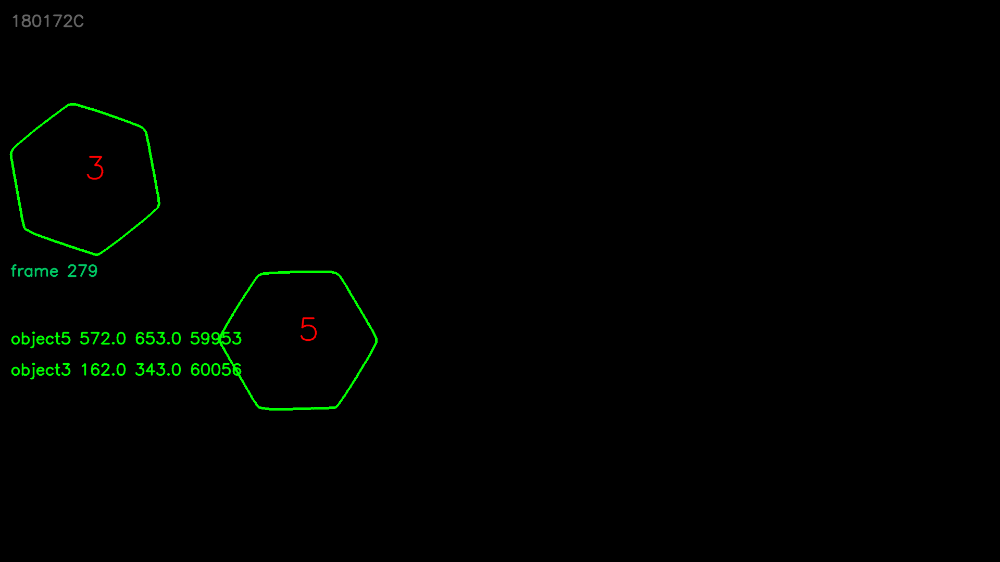

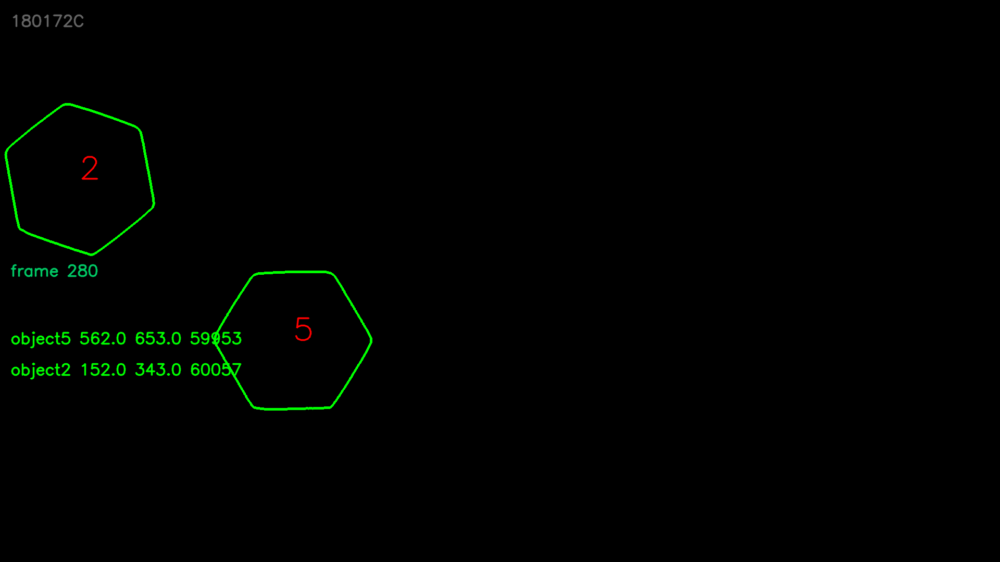

Can't receive frame (stream end?). Exiting ...


In [ ]:
from google.colab.patches import cv2_imshow

cap = cv.VideoCapture('conveyor_with_rotation.mp4') # give the correct path here
fourcc = cv.VideoWriter_fourcc('M','J','P','G')
width = int(cap.get(3))
height= int(cap.get(4))
out = cv.VideoWriter('output.mp4', fourcc, 10.0, (width, height))


kernel = np.ones((3,3),dtype="uint8")
Nuts=[]
delta_x = 15
count = 1
no_frames=0
font = cv.FONT_HERSHEY_SIMPLEX
while cap.isOpened():

    ret, frame = cap.read()
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break
    
    no_frames+=1

    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    th, img = cv.threshold(gray,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)
    closing = cv.morphologyEx(img, cv.MORPH_CLOSE, kernel)
    retval, labels, stats, centroids = get_indexed_image(closing)
    contours, hierarchy = cv.findContours(closing, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    im_contours_belt = np.zeros((gray.shape[0],gray.shape[1],3),dtype= "uint8")
    conts = cv.drawContours(im_contours_belt, contours, -1, (0,255,0), 3).astype('uint8')

    current=[]
    for elements in contours:
      if cv.matchShapes(contours_t[0],elements,cv.CONTOURS_MATCH_I1,0.0)<0.001:
        ca = cv.contourArea(elements)
        M = cv.moments(elements)
        cx, cy = int(M['m10']/M['m00']) , int(M['m01']/M['m00'])
        object_prev_frame = np.array([cx, cy, ca, count])
        i = np.array([0])
        delta = np.array([delta_x])

        if is_new(Nuts,object_prev_frame,delta,i):
          Nuts.append(object_prev_frame)
          current.append(object_prev_frame)
          count+=1
        else:
          Nuts[prev_index(Nuts,object_prev_frame,delta,i)][0]=object_prev_frame[0]
          Nuts[prev_index(Nuts,object_prev_frame,delta,i)][1]=object_prev_frame[1]
          Nuts[prev_index(Nuts,object_prev_frame,delta,i)][2]=object_prev_frame[2]
          current.append(Nuts[prev_index(Nuts,object_prev_frame,delta,i)])
    
    cv.putText(conts,"180172C",(20,50), font, 1,(100,100,100),2,cv.LINE_AA)
    cv.putText(conts,"frame "+str(int(no_frames)),(20,530), font, 1,(100,200,0),2,cv.LINE_AA)
    position=0
    for nuts in current:
      position+=60
      cv.putText(conts,str(int(nuts[-1])),(int(nuts[0]),int(nuts[1])), font, 2,(0,0,255),2,cv.LINE_AA)
      string="object"+str(int(nuts[-1]))+" "+str(nuts[0])+" "+str(nuts[1])+" "+str(int(nuts[2]))
      cv.putText(conts,string,(20,600+position), font, 1,(0,255,0),2,cv.LINE_AA)
    
    cv2_imshow(conts)
    out.write(conts)

    if cv.waitKey(1) == ord('q'):  
        break
out.release()
cap.release()
cv.destroyAllWindows()

In [ ]:
%%capture
!wget -nc https://raw.githubusercontent.com/brpy/colab-pdf/master/colab_pdf.py
from colab_pdf import colab_pdf
colab_pdf('Assignment5.ipynb')